In [1]:
import sys
sys.path.insert(0, '../code')

import os
import sys,time
import numpy as np
import math
import cv2

%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt

from keras.applications.imagenet_utils import preprocess_input
from keras.preprocessing import image

from models.ssd import build_ssd
from tools.ssd_utils import BBoxUtility
from tools.ssd_utils import BoundBox, box_iou


Using TensorFlow backend.


Define some useful variables

In [2]:
# Net output post-processing needs two parameters:
detection_threshold = 0.5 # Min probablity for a prediction to be considered
nms_threshold       = 0.2 # Non Maximum Suppression threshold
# IMPORTANT: the values of these two params will affect the final performance of the netwrok
#            you are allowed to find their optimal values in the validation/train sets

#weights_file = "/home/master/experiments/master/Experiments/TT100K_detection/baseline_ssd/weights.hdf5"
#path_to_images = "/home/master/experiments/Datasets/detection/TT100K_detection/test/"

weights_file = "/home/master/experiments/master/Experiments/TT100K_detection/imagenet_ssd/weights.hdf5"
path_to_images = "/home/master/experiments/Datasets/detection/TT100K_detection/test/"

#weights_file = "/home/master/experiments/master/Experiments/Udacity/imagenet_ssd/weights.hdf5"
#path_to_images = "/home/master/experiments/Datasets/detection/Udacity/train/"


if 'TT100K' in weights_file:
    # only for TT100K
    classes     = ['i2','i4','i5','il100','il60','il80','io','ip','p10','p11','p12','p19','p23','p26','p27','p3','p5','p6','pg','ph4','ph4.5','ph5','pl100','pl120','pl20','pl30','pl40','pl5','pl50','pl60','pl70','pl80','pm20','pm30','pm55','pn','pne','po','pr40','w13','w32','w55','w57','w59','wo']
elif 'Udacity' in weights_file:
    classes     = ['Car', 'Pedestrian','Truck']
    
input_shape = (300,300,3)

NUM_CLASSES = len(classes)+1

Create an SSD model an load the weights

In [3]:
model = build_ssd(img_shape=input_shape,n_classes=NUM_CLASSES)
model.load_weights(weights_file)

Prepare variables to compute metrics

In [4]:
test_dir = path_to_images
imfiles = [os.path.join(test_dir,f) for f in os.listdir(test_dir) 
                                    if os.path.isfile(os.path.join(test_dir,f)) 
                                    and f.endswith('jpg')]

if len(imfiles) == 0:
    print "ERR: path_to_images do not contain any jpg file"
    quit()

Loop through images

128/128 [==============================] - 3s      
128 images predicted in 3.72531 seconds. 34.35950 fps


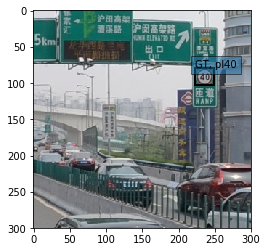

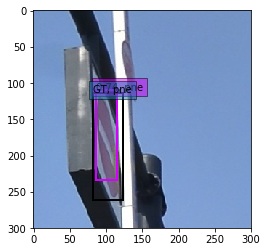

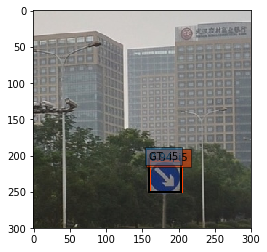

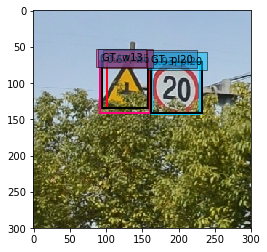

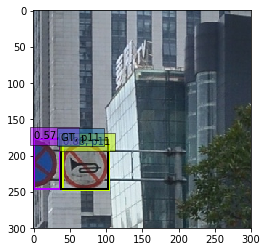

...

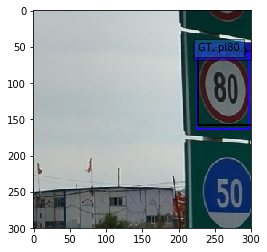

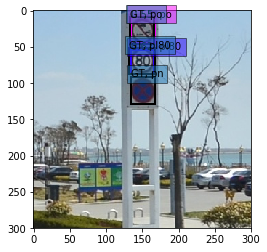

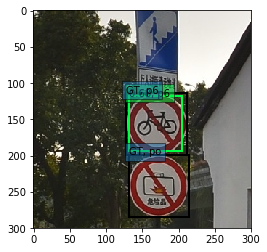

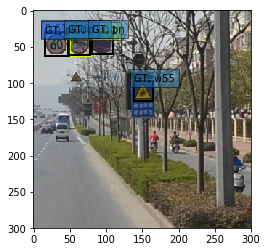

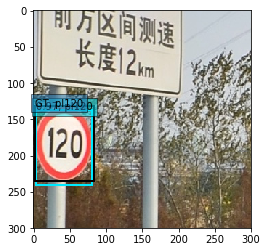

Precission = 0.936170212766
Recall     = 0.631578947368
F-score    = 0.754285714286


In [5]:
inputs = []
img_paths = []
chunk_size = 128 # we are going to process all image files in chunks

ok = 0.
total_true = 0.
total_pred = 0.
bbox_util = BBoxUtility(NUM_CLASSES-1, sess=True, nms_thresh=nms_threshold) # -1 because the void class is added inside

plot_boxes = True

for i,img_path in enumerate(imfiles):
    img = image.load_img(img_path, target_size=(input_shape[0], input_shape[1]))
    img = image.img_to_array(img)
    img = img / 255.
    inputs.append(img.copy())
    img_paths.append(img_path)

    if len(img_paths)%chunk_size == 0 or i+1 == len(imfiles):
        inputs = np.array(inputs)
        start_time = time.time()
        net_out = model.predict(inputs, batch_size=16, verbose=1)
        print ('{} images predicted in {:.5f} seconds. {:.5f} fps').format(len(inputs),time.time() - start_time,(len(inputs)/(time.time() - start_time)))
        
        # predicted boxes
        results = bbox_util.detection_out(net_out)
        for i,img_path in enumerate(img_paths):
            # load ground truth
            boxes_true = []
            label_path = img_path.replace('jpg','txt')
            gt = np.loadtxt(label_path)
            if len(gt.shape) == 1:
                gt = gt[np.newaxis,]
            for j in range(gt.shape[0]):
                bx = BoundBox(len(classes))
                bx.probs[int(gt[j,0])] = 1.
                box = gt[j,:]
                bx.xmin = box[1] - box[3]/2
                bx.ymin = box[2] - box[4]/2
                bx.xmax = box[1] + box[3]/2
                bx.ymax = box[2] + box[4]/2
                boxes_true.append(bx)
            
            img = inputs[i]
            # Parse the outputs.
            if len(results[i]) == 0:
                continue
                
            det_label, det_conf, det_xmin, det_ymin, det_xmax, det_ymax = results[i][:,0], results[i][:,1], results[i][:,2], results[i][:,3], results[i][:,4], results[i][:,5]

            # Get detections with confidence higher than detection_threshold.
            top_indices = [i for i, conf in enumerate(det_conf) if conf >= detection_threshold]

            top_conf = det_conf[top_indices]
            top_label_indices = det_label[top_indices].tolist()            
            top_xmin = det_xmin[top_indices]
            top_ymin = det_ymin[top_indices]
            top_xmax = det_xmax[top_indices]
            top_ymax = det_ymax[top_indices]
            
            # compute metrics
            total_true += len(boxes_true)
            true_matched = np.zeros(len(boxes_true))
            for pred_idx in range(top_conf.shape[0]):
                b = BoundBox(len(classes))
                b.xmin = top_xmin[pred_idx]
                b.ymin = top_ymin[pred_idx]
                b.xmax = top_xmax[pred_idx]
                b.xmax +=(b.xmax-b.xmin)
                b.ymax = top_ymax[pred_idx]
                b.ymax +=(b.ymax-b.ymin)
                label = int(top_label_indices[pred_idx])
                b.probs[label-1] = 1.
                
                total_pred += 1.
                
                for t,a in enumerate(boxes_true):
                    if true_matched[t]:
                        continue
                    if box_iou(a, b) > 0.5 and np.argmax(a.probs) == np.argmax(b.probs):
                        true_matched[t] = 1
                        ok += 1.
                        break
            
            # plot
            if plot_boxes:
                colors = plt.cm.hsv(np.linspace(0, 1, len(classes))).tolist()

                plt.imshow(img)
                currentAxis = plt.gca()

                for i in range(top_conf.shape[0]):
                    xmin = int(round(top_xmin[i] * img.shape[1]))
                    ymin = int(round(top_ymin[i] * img.shape[0]))
                    xmax = int(round(top_xmax[i] * img.shape[1]))
                    ymax = int(round(top_ymax[i] * img.shape[0]))
                    score = top_conf[i]
                    label = int(top_label_indices[i])
                    label_name = classes[label - 1]
                    #rint('PREDICTED',i,label,label_name, score)
                    display_txt = '{:0.2f}, {}'.format(score, label_name)
                    coords = (xmin, ymin), (xmax-xmin)*2+1, (ymax-ymin)*2+1
                    color = colors[label-1]
                    currentAxis.add_patch(plt.Rectangle(*coords, fill=False, edgecolor=color, linewidth=2))
                    currentAxis.text(xmin, ymin, display_txt, bbox={'facecolor':color, 'alpha':0.5})

                # display ground truth
                for i in range(len(boxes_true)):
                    bx = boxes_true[i]
                    xmin = int(round(bx.xmin * img.shape[1]))
                    ymin = int(round(bx.ymin * img.shape[0]))
                    xmax = int(round(bx.xmax * img.shape[1]))
                    ymax = int(round(bx.ymax * img.shape[0]))
                    label = np.argmax(bx.probs)
                    #rint('GT', i, label)
                    label_name = classes[label]
                    display_txt = 'GT, {}'.format(label_name)
                    coords = (xmin, ymin), xmax-xmin+1, ymax-ymin+1
                    currentAxis.add_patch(plt.Rectangle(*coords, fill=False, linewidth=2))
                    currentAxis.text(xmin, ymin, display_txt, bbox={'alpha':0.5})

                plt.show()
                #break
            
        inputs = []
        img_paths = []
        
        #print 'total_true:',total_true,' total_pred:',total_pred,' ok:',ok
        p = 0. if total_pred == 0 else (ok/total_pred)
        r = ok/total_true
        print('Precission = '+str(p))
        print('Recall     = '+str(r))
        f = 0. if (p+r) == 0 else (2*p*r/(p+r))
        print('F-score    = '+str(f))
        break